In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

%matplotlib inline
plt.rcParams["figure.figsize"] = (10, 6)
plt.rcParams["figure.dpi"] = 300
plt.style.use("seaborn")

## Analysis of Autoencoder


In [2]:
import os
from scipy.stats import norm

from models.AE import Autoencoder
from utils.loaders import load_mnist, load_model
from utils.callbacks import CustomCallback

In [3]:
# run params
SECTION = "vae"
RUN_ID = "0001"
DATA_NAME = "digits"
RUN_FOLDER = f"run/{SECTION}"
RUN_FOLDER += "_".join([RUN_ID, DATA_NAME])

if not os.path.exists(RUN_FOLDER):
    os.mkdir(RUN_FOLDER)
    os.mkdir(os.path.join(RUN_FOLDER, "viz"))
    os.mkdir(os.path.join(RUN_FOLDER, "images"))
    os.mkdir(os.path.join(RUN_FOLDER, "weights"))

MODE = "build"


In [4]:
(x_train, y_train), (x_test, y_test) = load_mnist()

In [5]:
AE = Autoencoder(
    input_dim = (28,28,1),
    encoder_conv_filters = [32,64,64,64],
    encoder_conv_kernel_size = [3,3,3,3],
    encoder_conv_strides = [1,2,2,1],
    decoder_conv_t_filters = [64,64,32,1],
    decoder_conv_t_kernel_size = [3,3,3,3],
    decoder_conv_t_strides = [1,2,2,1],
    z_dim = 2
)

if MODE == "build":
    AE.save(RUN_FOLDER)
else:
    AE.load_weights(os.path.join(RUN_FOLDER, 'weights/weights.h5'))

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model/model_to_dot to work.
You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model/model_to_dot to work.
You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model/model_to_dot to work.


In [6]:
AE.encoder.summary()

Model: "model"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 encoder_input (InputLayer)  [(None, 28, 28, 1)]       0         
                                                                 
 encoder_conv_0 (Conv2D)     (None, 28, 28, 32)        320       
                                                                 
 leaky_re_lu (LeakyReLU)     (None, 28, 28, 32)        0         
                                                                 
 encoder_conv_1 (Conv2D)     (None, 14, 14, 64)        18496     
                                                                 
 leaky_re_lu_1 (LeakyReLU)   (None, 14, 14, 64)        0         
                                                                 
 encoder_conv_2 (Conv2D)     (None, 7, 7, 64)          36928     
                                                                 
 leaky_re_lu_2 (LeakyReLU)   (None, 7, 7, 64)          0     

In [7]:
AE.decoder.summary()

Model: "model_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 decoder_input (InputLayer)  [(None, 2)]               0         
                                                                 
 dense (Dense)               (None, 3136)              9408      
                                                                 
 reshape (Reshape)           (None, 7, 7, 64)          0         
                                                                 
 decoder_conv_t_0 (Conv2DTra  (None, 7, 7, 64)         36928     
 nspose)                                                         
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 7, 7, 64)          0         
                                                                 
 decoder_conv_t_1 (Conv2DTra  (None, 14, 14, 64)       36928     
 nspose)                                                   

In [30]:
# train the autoencoder
AE.compile(learning_rate=0.0005)

AE.train(
    x_train[:1000],
    batch_size=32,
    epochs=200,
    run_folder=RUN_FOLDER,
    initial_epoch=0,
)

Epoch 1/200
32/32 [==============================] - ETA: 0s - loss: 0.0403
Epoch 1: saving model to run/vae0002_digits/weights/weights.h5
32/32 [==============================] - 3s 55ms/step - loss: 0.0403 - lr: 5.0000e-04
Epoch 2/200
31/32 [============================>.] - ETA: 0s - loss: 0.0391
Epoch 2: saving model to run/vae0002_digits/weights/weights.h5
32/32 [==============================] - 1s 30ms/step - loss: 0.0390 - lr: 5.0000e-04
Epoch 3/200
31/32 [============================>.] - ETA: 0s - loss: 0.0386
Epoch 3: saving model to run/vae0002_digits/weights/weights.h5
32/32 [==============================] - 1s 25ms/step - loss: 0.0386 - lr: 5.0000e-04
Epoch 4/200
30/32 [===========================>..] - ETA: 0s - loss: 0.0381
Epoch 4: saving model to run/vae0002_digits/weights/weights.h5
32/32 [==============================] - 1s 31ms/step - loss: 0.0381 - lr: 5.0000e-04
Epoch 5/200
30/32 [===========================>..] - ETA: 0s - loss: 0.0380
Epoch 5: saving model to

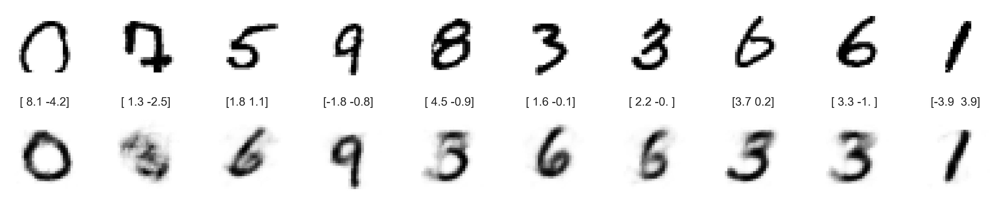

In [31]:
# reconstructing original paintings

n_to_show = 10
example_idx = np.random.choice(range(len(x_test)), n_to_show)
example_images = x_test[example_idx]

z_points = AE.encoder.predict(example_images)

reconst_images = AE.decoder.predict(z_points)

fig = plt.figure(figsize=(15, 3))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

for i in range(n_to_show):
    img = example_images[i].squeeze()
    ax = fig.add_subplot(2, n_to_show, i + 1)
    ax.axis("off")
    ax.text(0.5, -0.35, str(np.round(z_points[i], 1)), fontsize=10, ha="center", transform=ax.transAxes)
    ax.imshow(img, cmap="gray_r")

for i in range(n_to_show):
    img = reconst_images[i].squeeze()
    ax = fig.add_subplot(2, n_to_show, i + 1 + n_to_show)
    ax.axis("off")
    ax.imshow(img, cmap="gray_r")


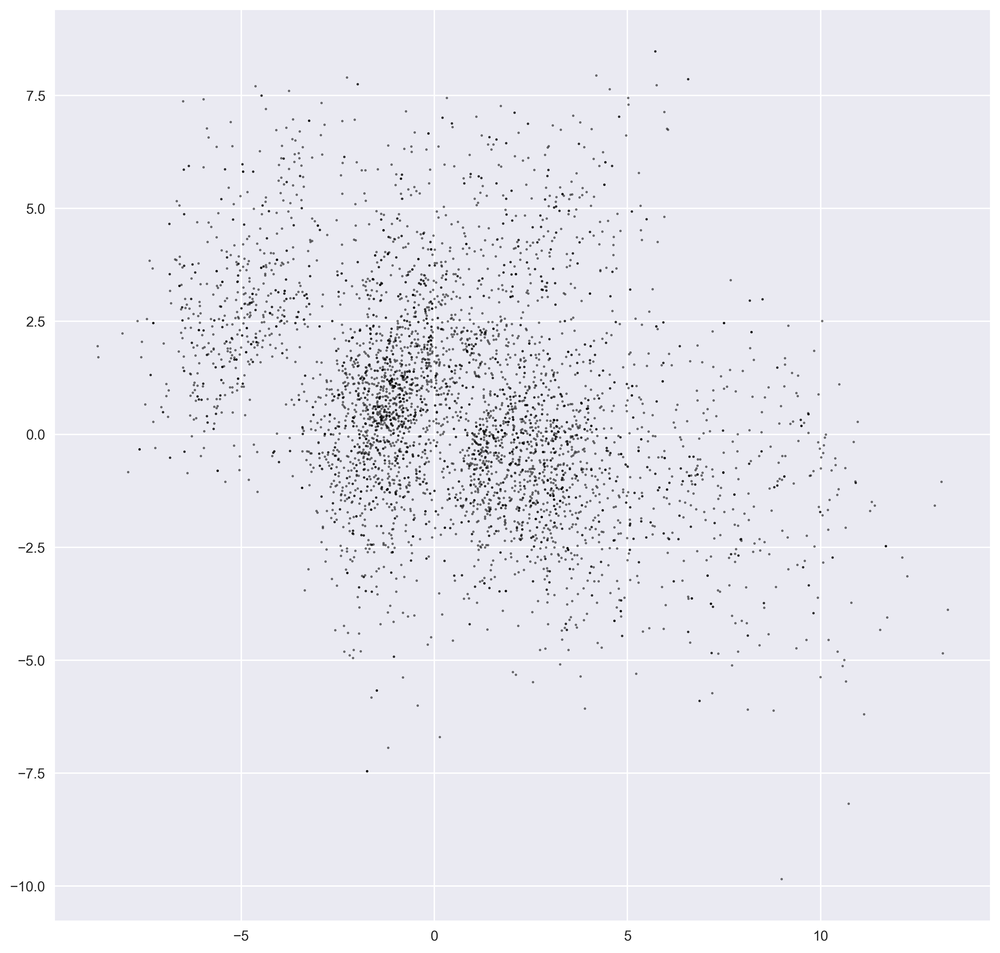

In [32]:
# Mr N. Coder's wall

n_to_show = 5000
grid_size = 15

example_idx = np.random.choice(range(len(x_test)), n_to_show)
example_images = x_test[example_idx]
example_labels = y_test[example_idx]

z_points = AE.encoder.predict(example_images)

min_x = min(z_points[:, 0])
max_x = max(z_points[:, 0])
min_y = min(z_points[:, 1])
max_y = max(z_points[:, 1])

plt.figure(figsize=(12, 12))
plt.scatter(z_points[:, 0], z_points[:, 1], c="black", alpha=0.5, s=2)
plt.show()

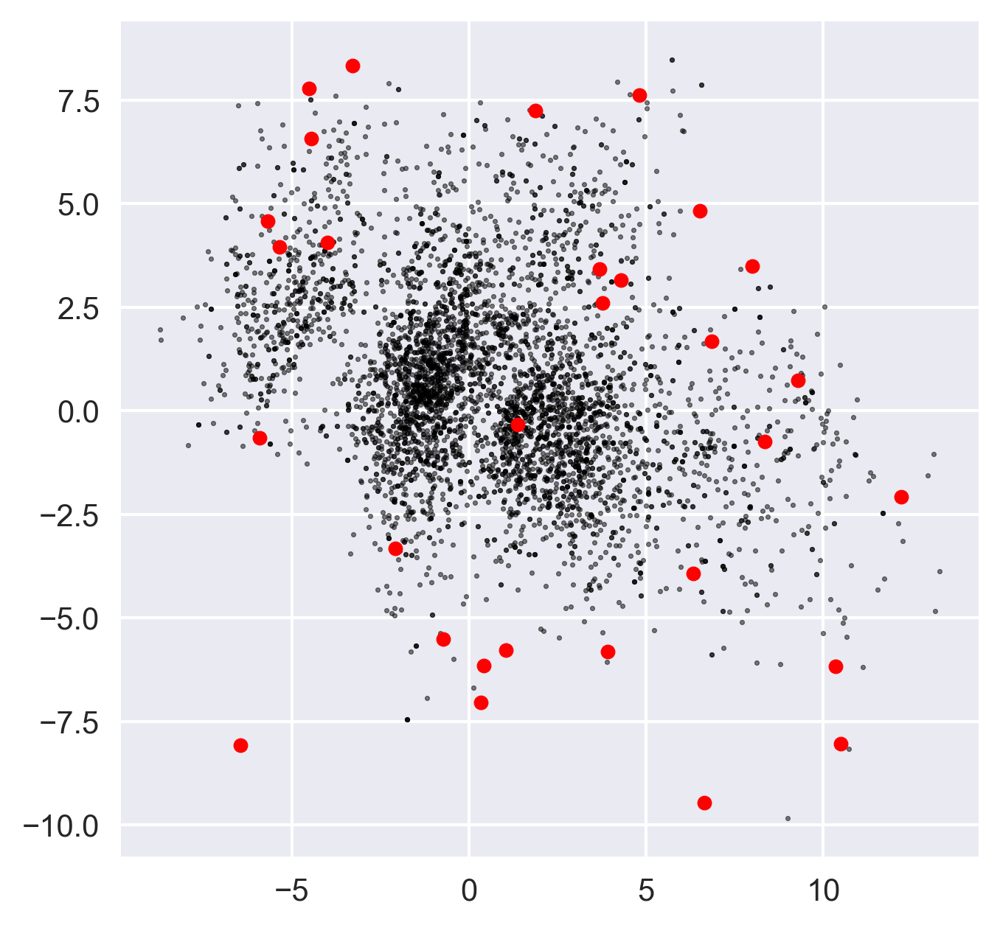

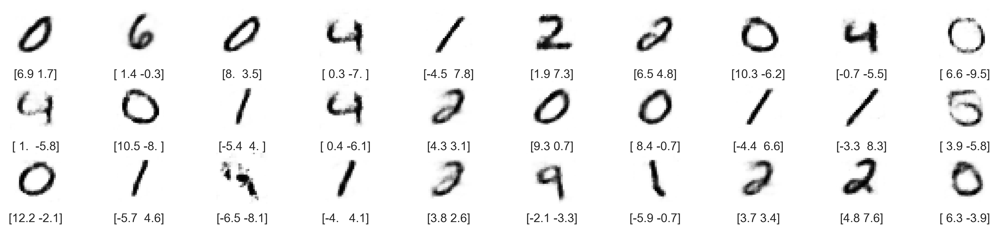

In [33]:
# the new generated art exhibition

plt.figure(figsize=(5, 5))
plt.scatter(z_points[:, 0], z_points[:, 1], c="black", alpha=0.5, s=2)

grid_size = 10
grid_depth = 3

x = np.random.uniform(min_x, max_x, size=grid_size*grid_depth)
y = np.random.uniform(min_y, max_y, size=grid_size*grid_depth)
z_grid = np.array(list(zip(x, y)))
reconst = AE.decoder.predict(z_grid)

plt.scatter(z_grid[:, 0], z_grid[:, 1], c="red", alpha=1, s=20)
plt.show()


fig = plt.figure(figsize=(15, grid_depth))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

for i in range(grid_size*grid_depth):
    ax = fig.add_subplot(grid_depth, grid_size, i + 1)
    ax.axis("off")
    ax.text(0.5, -0.35, str(np.round(z_grid[i], 1)), fontsize=10, ha="center", transform=ax.transAxes)

    ax.imshow(reconst[i, :, :, 0], cmap="Greys")


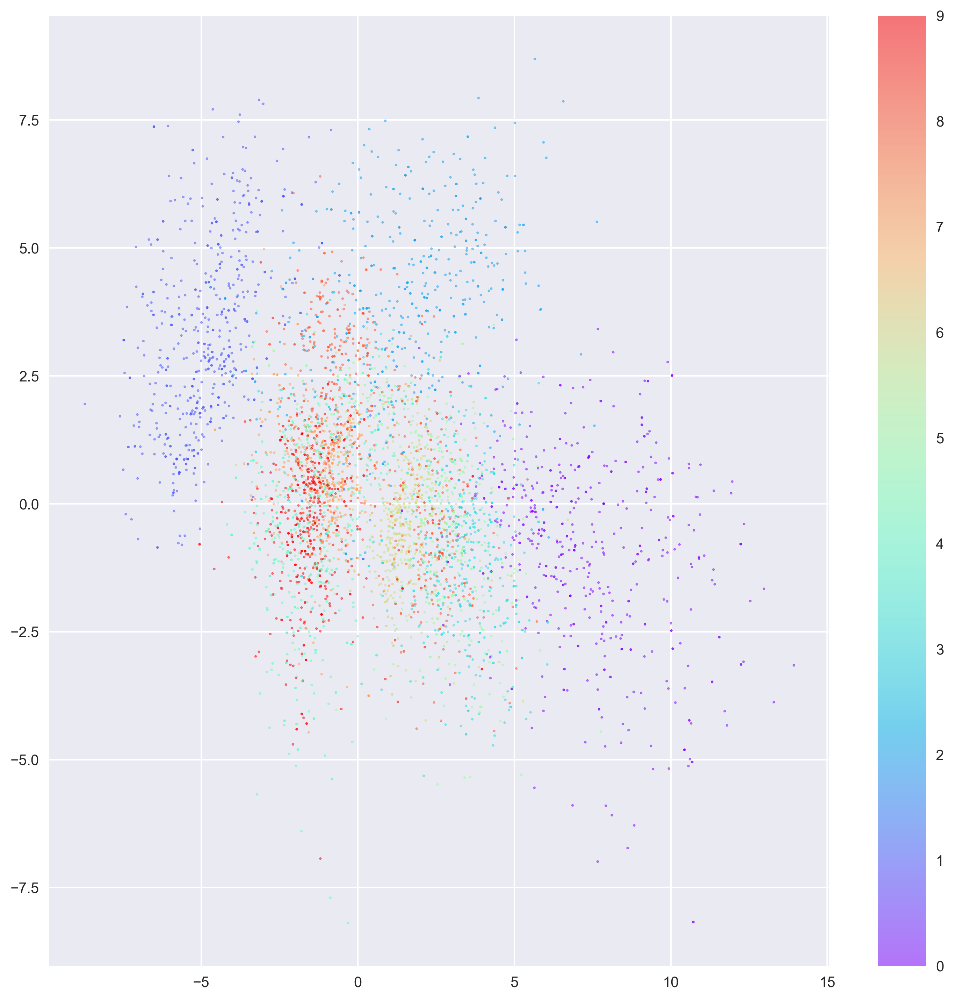

In [34]:
n_to_show = 5000
grid_size = 15

example_idx = np.random.choice(range(len(x_test)), n_to_show)
example_images = x_test[example_idx]
example_labels = y_test[example_idx]

z_points = AE.encoder.predict(example_images)

plt.figure(figsize=(12, 12))
plt.scatter(z_points[:, 0], z_points[:, 1], cmap="rainbow", c=example_labels, alpha=0.5, s=2)
plt.colorbar()
plt.show()

Autoencoderには数字のラベルを全く提示していないにもかかわらず、似たように見える数字が潜在空間の同じ部分に自然に集まっている。

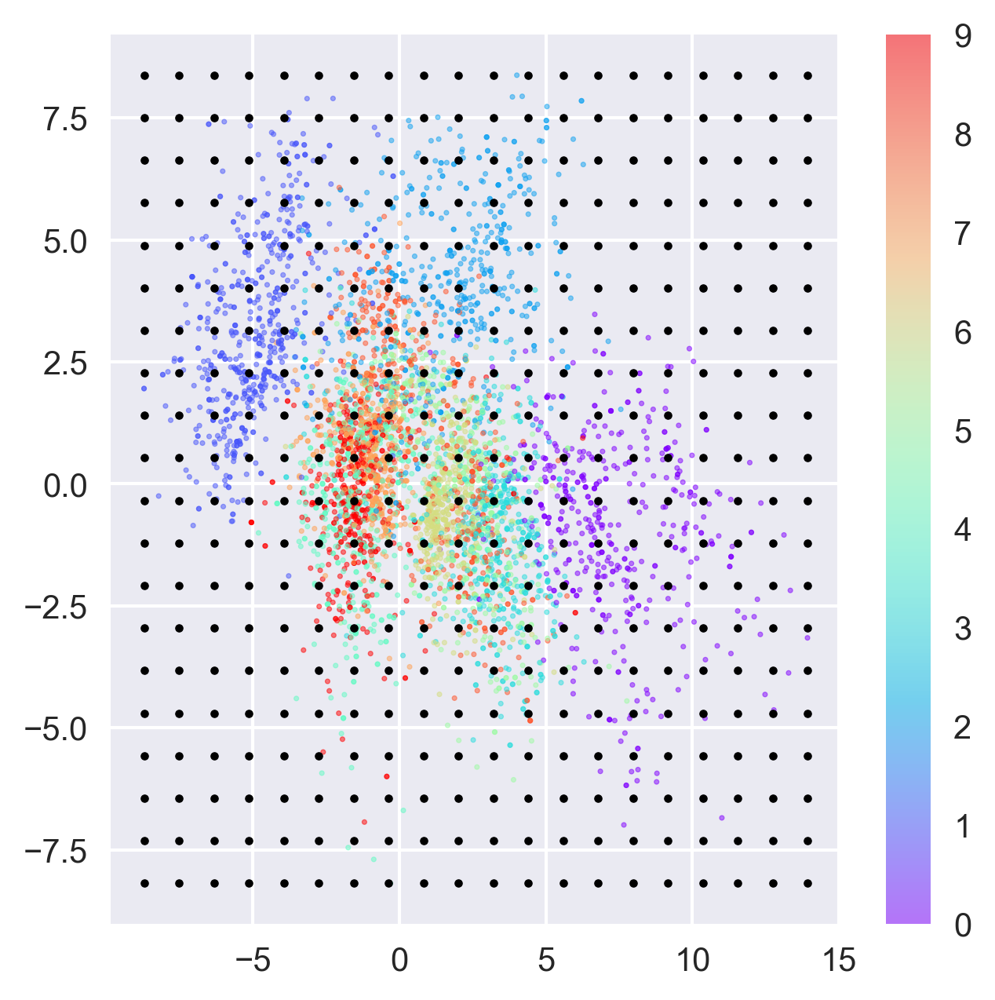

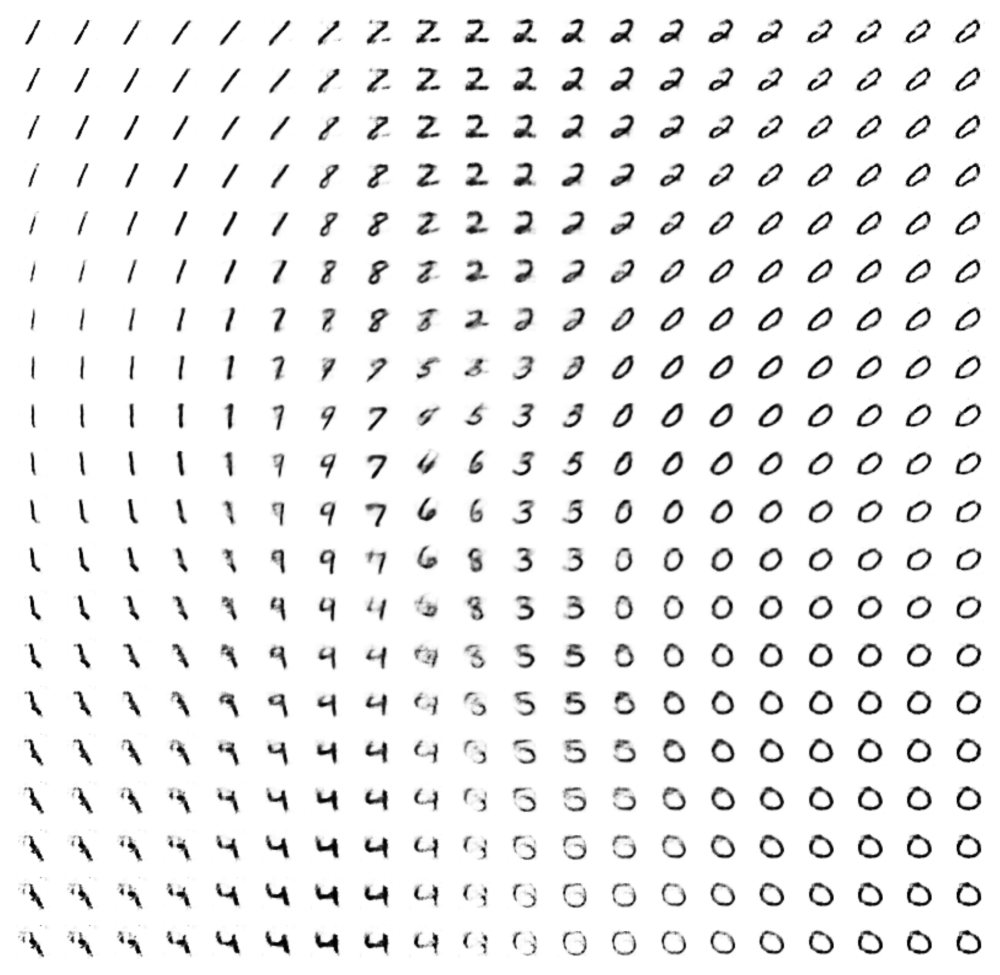

In [35]:
n_to_show = 5000
grid_size = 20

example_idx = np.random.choice(range(len(x_test)), n_to_show)
example_images = x_test[example_idx]
example_labels = y_test[example_idx]

z_points = AE.encoder.predict(example_images)

plt.figure(figsize=(5, 5))
plt.scatter(z_points[:, 0], z_points[:, 1], cmap="rainbow", c=example_labels, alpha=0.5, s=2)
plt.colorbar()

x = np.linspace(min(z_points[:, 0]), max(z_points[:, 0]), grid_size)
y = np.linspace(max(z_points[:, 1]), min(z_points[:, 1]), grid_size)
xv, yv = np.meshgrid(x, y)
xv = xv.flatten()
yv = yv.flatten()
z_grid = np.array(list(zip(xv, yv)))

reconst = AE.decoder.predict(z_grid)

plt.scatter(z_grid[:, 0], z_grid[:, 1], c="black", alpha=1, s=5)
plt.show()

fig = plt.figure(figsize=(8, 8))
fig.subplots_adjust(hspace=0.4, wspace=0.4)
for i in range(grid_size**2):
    ax = fig.add_subplot(grid_size, grid_size, i+1)
    ax.axis("off")
    ax.imshow(reconst[i, :, :, 0], cmap="Greys")

## Variational Autoencoder


In [3]:
from models.VAE import VariationalAutoencoder
from tensorflow.python.framework.ops import disable_eager_execution
disable_eager_execution() # エラー対処 https://github.com/davidADSP/GDL_code/issues/87

# run params
SECTION = "vae"
RUN_ID = "0002"
DATA_NAME = "digits"
RUN_FOLDER = f"run/{SECTION}"
RUN_FOLDER += "_".join([RUN_ID, DATA_NAME])

if not os.path.exists(RUN_FOLDER):
    os.mkdir(RUN_FOLDER)
    os.mkdir(os.path.join(RUN_FOLDER, "viz"))
    os.mkdir(os.path.join(RUN_FOLDER, "images"))
    os.mkdir(os.path.join(RUN_FOLDER, "weights"))

mode = "build"

In [37]:
(x_train, y_train), (x_test, y_test) = load_mnist()

In [38]:
VAE = VariationalAutoencoder(
    input_dim=(28, 28, 1),
    encoder_conv_filters=[32, 64, 64, 64],
    encoder_conv_kernel_size=[3, 3, 3, 3],
    encoder_conv_strides=[1, 2, 2, 1],
    decoder_conv_t_filters=[64, 64, 32, 1],
    decoder_conv_t_kernel_size=[3, 3, 3, 3],
    decoder_conv_t_strides=[1, 2, 2, 1],
    z_dim=2,
)

if mode == "build":
    VAE.save(RUN_FOLDER)
else:
    VAE.load_weights(os.path.join(RUN_FOLDER, "weights/weights.h5"))

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model/model_to_dot to work.
You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model/model_to_dot to work.
You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model/model_to_dot to work.


In [39]:
VAE.encoder.summary()

Model: "model_12"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 encoder_input (InputLayer)     [(None, 28, 28, 1)]  0           []                               
                                                                                                  
 encoder_conv_0 (Conv2D)        (None, 28, 28, 32)   320         ['encoder_input[0][0]']          
                                                                                                  
 leaky_re_lu_21 (LeakyReLU)     (None, 28, 28, 32)   0           ['encoder_conv_0[0][0]']         
                                                                                                  
 encoder_conv_1 (Conv2D)        (None, 14, 14, 64)   18496       ['leaky_re_lu_21[0][0]']         
                                                                                           

In [40]:
VAE.decoder.summary()

Model: "model_13"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 decoder_input (InputLayer)  [(None, 2)]               0         
                                                                 
 dense_3 (Dense)             (None, 3136)              9408      
                                                                 
 reshape_3 (Reshape)         (None, 7, 7, 64)          0         
                                                                 
 decoder_conv_t_0 (Conv2DTra  (None, 7, 7, 64)         36928     
 nspose)                                                         
                                                                 
 leaky_re_lu_25 (LeakyReLU)  (None, 7, 7, 64)          0         
                                                                 
 decoder_conv_t_1 (Conv2DTra  (None, 14, 14, 64)       36928     
 nspose)                                                  

In [41]:
# training
LEARNING_RATE = 0.0005
R_LOSS_FACTOR = 1000

VAE.compile(LEARNING_RATE, R_LOSS_FACTOR)

In [43]:
VAE.train(
    x_train[:1000],
    batch_size=32,
    epochs=200,
    run_folder=RUN_FOLDER,
    print_every_n_batches=100,
    initial_epoch=0,
)

Train on 1000 samples
Epoch 1/200
1000/1000 [==============================] - ETA: 0s - loss: 44.2381 - vae_r_loss: 39.2515 - vae_kl_loss: 4.9866
Epoch 1: saving model to run/vae0002_digits/weights/weights-001-44.24.h5

Epoch 1: saving model to run/vae0002_digits/weights/weights.h5
1000/1000 [==============================] - 1s 922us/sample - loss: 44.2381 - vae_r_loss: 39.2515 - vae_kl_loss: 4.9866 - lr: 5.0000e-04
Epoch 2/200
 960/1000 [===========================>..] - ETA: 0s - loss: 43.6087 - vae_r_loss: 38.4511 - vae_kl_loss: 5.1576
Epoch 2: saving model to run/vae0002_digits/weights/weights-002-43.56.h5

Epoch 2: saving model to run/vae0002_digits/weights/weights.h5
1000/1000 [==============================] - 1s 847us/sample - loss: 43.5607 - vae_r_loss: 38.4147 - vae_kl_loss: 5.1460 - lr: 5.0000e-04
Epoch 3/200
 960/1000 [===========================>..] - ETA: 0s - loss: 43.2565 - vae_r_loss: 38.1682 - vae_kl_loss: 5.0882
Epoch 3: saving model to run/vae0002_digits/weights/w

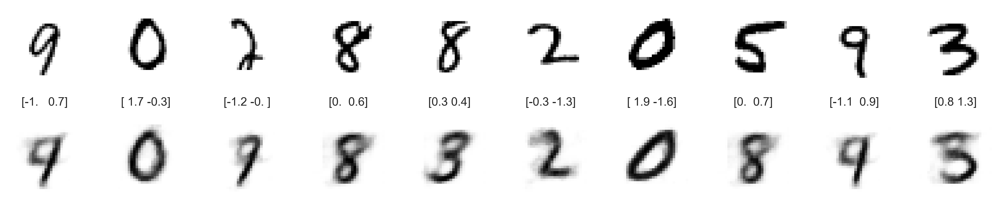

In [44]:
# reconstructing original paintings

n_to_show = 10
example_idx = np.random.choice(range(len(x_test)), n_to_show)
example_images = x_test[example_idx]

z_points = VAE.encoder.predict(example_images)

reconst_images = VAE.decoder.predict(z_points)

fig = plt.figure(figsize=(15, 3))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

for i in range(n_to_show):
    img = example_images[i].squeeze()
    ax = fig.add_subplot(2, n_to_show, i + 1)
    ax.axis("off")
    ax.text(0.5, -0.35, str(np.round(z_points[i], 1)), fontsize=10, ha="center", transform=ax.transAxes)
    ax.imshow(img, cmap="gray_r")

for i in range(n_to_show):
    img = reconst_images[i].squeeze()
    ax = fig.add_subplot(2, n_to_show, i + 1 + n_to_show)
    ax.axis("off")
    ax.imshow(img, cmap="gray_r")


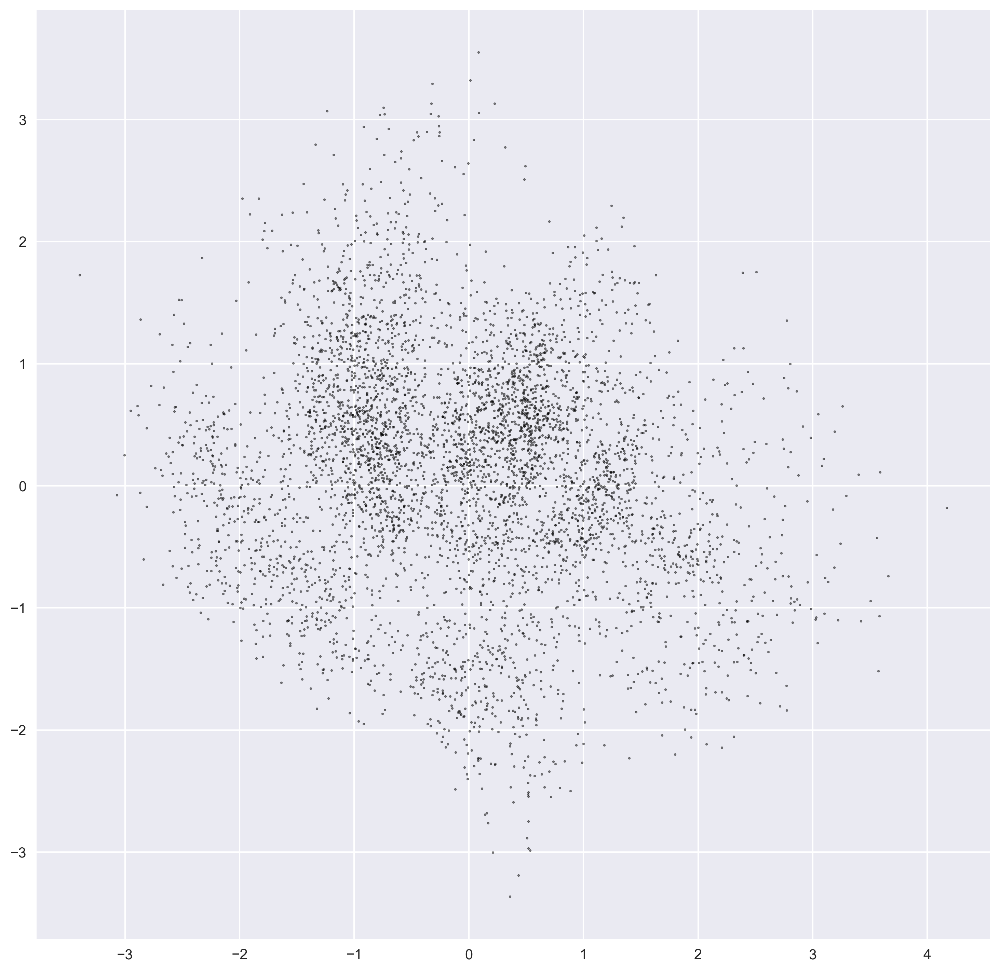

In [45]:
# Mr N. Coder's wall

n_to_show = 5000
grid_size = 15

example_idx = np.random.choice(range(len(x_test)), n_to_show)
example_images = x_test[example_idx]
example_labels = y_test[example_idx]

z_points = VAE.encoder.predict(example_images)

min_x = min(z_points[:, 0])
max_x = max(z_points[:, 0])
min_y = min(z_points[:, 1])
max_y = max(z_points[:, 1])

plt.figure(figsize=(12, 12))
plt.scatter(z_points[:, 0], z_points[:, 1], c="black", alpha=0.5, s=2)
plt.show()

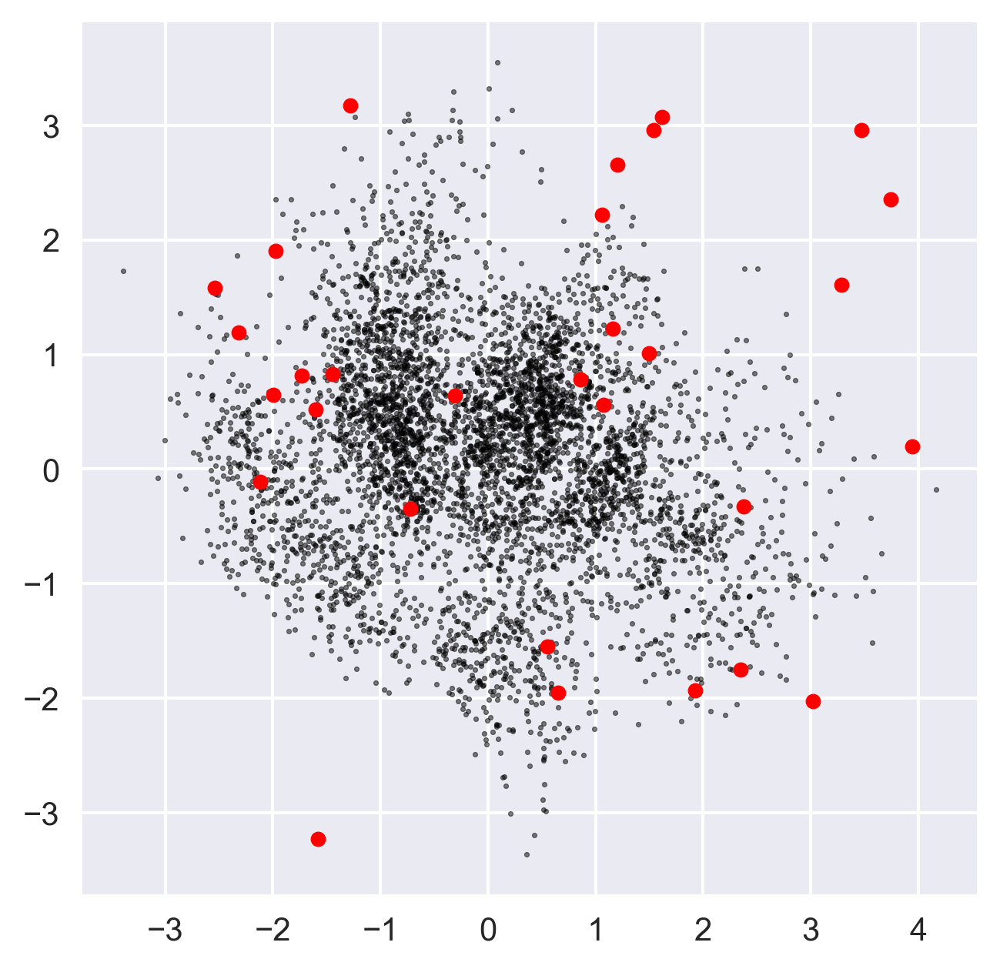

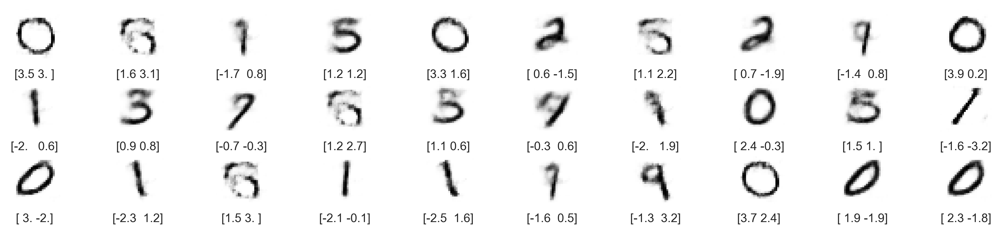

In [46]:
# the new generated art exhibition

plt.figure(figsize=(5, 5))
plt.scatter(z_points[:, 0], z_points[:, 1], c="black", alpha=0.5, s=2)

grid_size = 10
grid_depth = 3

x = np.random.uniform(min_x, max_x, size=grid_size*grid_depth)
y = np.random.uniform(min_y, max_y, size=grid_size*grid_depth)
z_grid = np.array(list(zip(x, y)))
reconst = VAE.decoder.predict(z_grid)

plt.scatter(z_grid[:, 0], z_grid[:, 1], c="red", alpha=1, s=20)
plt.show()


fig = plt.figure(figsize=(15, grid_depth))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

for i in range(grid_size*grid_depth):
    ax = fig.add_subplot(grid_depth, grid_size, i + 1)
    ax.axis("off")
    ax.text(0.5, -0.35, str(np.round(z_grid[i], 1)), fontsize=10, ha="center", transform=ax.transAxes)

    ax.imshow(reconst[i, :, :, 0], cmap="Greys")


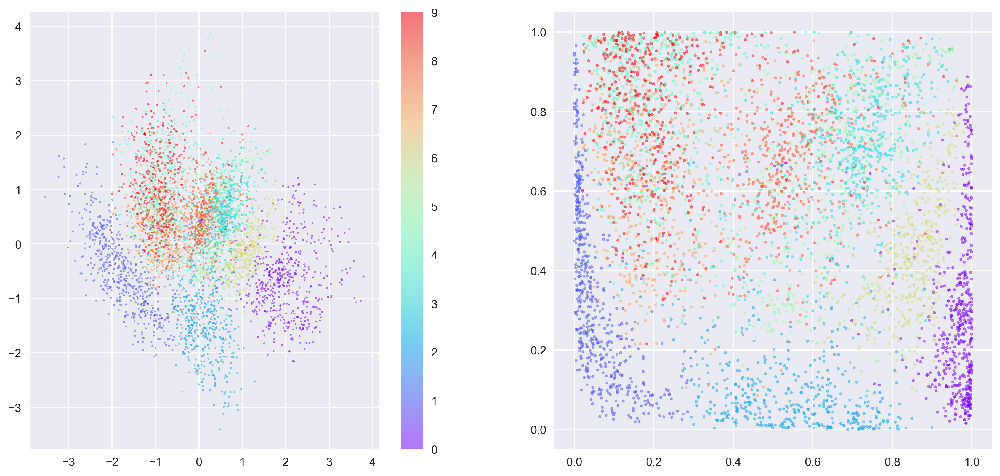

In [54]:
n_to_show = 5000
grid_size = 15

example_idx = np.random.choice(range(len(x_test)), n_to_show)
example_images = x_test[example_idx]
example_labels = y_test[example_idx]

z_points = VAE.encoder.predict(example_images)
p_points = norm.cdf(z_points)

fig = plt.figure(figsize=(15, 7))

ax = fig.add_subplot(1, 2, 1)
plot_1 = ax.scatter(z_points[:, 0] , z_points[:, 1] , cmap='rainbow' , c= example_labels, alpha=0.5, s=2)
plt.colorbar(plot_1)

ax = fig.add_subplot(1, 2, 2)
plot_2 = ax.scatter(p_points[:, 0] , p_points[:, 1] , cmap='rainbow' , c= example_labels, alpha=0.5, s=5)

plt.show()

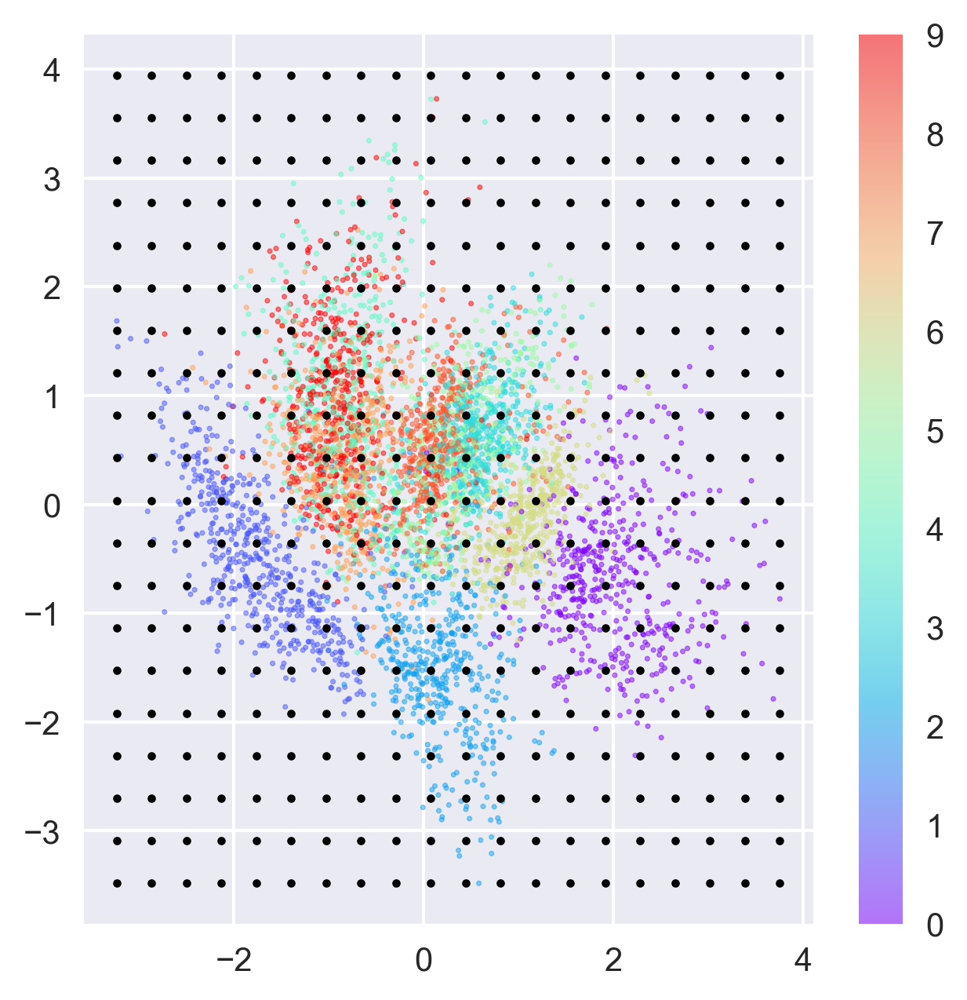

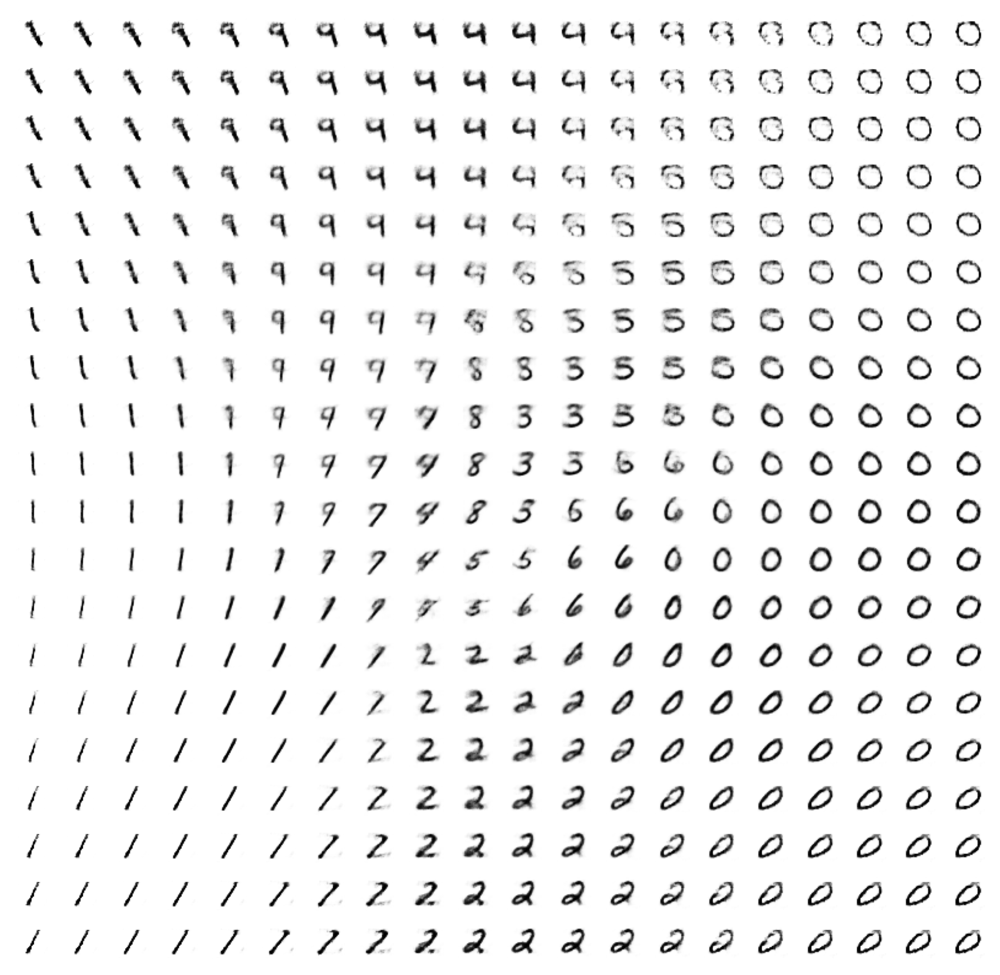

In [51]:
n_to_show = 5000
grid_size = 20

example_idx = np.random.choice(range(len(x_test)), n_to_show)
example_images = x_test[example_idx]
example_labels = y_test[example_idx]

z_points = VAE.encoder.predict(example_images)

plt.figure(figsize=(5, 5))
plt.scatter(z_points[:, 0], z_points[:, 1], cmap="rainbow", c=example_labels, alpha=0.5, s=2)
plt.colorbar()

x = np.linspace(min(z_points[:, 0]), max(z_points[:, 0]), grid_size)
y = np.linspace(max(z_points[:, 1]), min(z_points[:, 1]), grid_size)
xv, yv = np.meshgrid(x, y)
xv = xv.flatten()
yv = yv.flatten()
z_grid = np.array(list(zip(xv, yv)))

reconst = VAE.decoder.predict(z_grid)

plt.scatter(z_grid[:, 0], z_grid[:, 1], c="black", alpha=1, s=5)
plt.show()

fig = plt.figure(figsize=(8, 8))
fig.subplots_adjust(hspace=0.4, wspace=0.4)
for i in range(grid_size**2):
    ax = fig.add_subplot(grid_size, grid_size, i+1)
    ax.axis("off")
    ax.imshow(reconst[i, :, :, 0], cmap="Greys")

## Faces Dataset

In [4]:
from glob import glob
from models.VAE import VariationalAutoencoder
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.python.framework.ops import disable_eager_execution
disable_eager_execution() # エラー対処 https://github.com/davidADSP/GDL_code/issues/87

# run params
SECTION = "vae"
RUN_ID = "0001"
DATA_NAME = "faces"
RUN_FOLDER = f"run/{SECTION}{RUN_ID}_{DATA_NAME}"

if not os.path.exists(RUN_FOLDER):
    os.mkdir(RUN_FOLDER)
    os.mkdir(os.path.join(RUN_FOLDER, "viz"))
    os.mkdir(os.path.join(RUN_FOLDER, "images"))
    os.mkdir(os.path.join(RUN_FOLDER, "weights"))

# mode = "build"
mode = "load"

In [5]:
DATA_FOLDER = "data/celeba/img_align_celeba/"

INPUT_DIM = (128, 128, 3)
BATCH_SIZE = 32

filenames = np.array(glob(os.path.join(DATA_FOLDER, '*/*.jpg')))

NUM_IMAGES = len(filenames)

In [6]:
data_gen = ImageDataGenerator(rescale=1./255)

data_flow = data_gen.flow_from_directory(DATA_FOLDER, target_size=INPUT_DIM[:2], batch_size=BATCH_SIZE, shuffle=True, class_mode="input", subset="training")

Found 202599 images belonging to 1 classes.


In [7]:
VAE = VariationalAutoencoder(
    input_dim=INPUT_DIM,
    encoder_conv_filters=[32, 64, 64, 64],
    encoder_conv_kernel_size=[3, 3, 3, 3],
    encoder_conv_strides=[2, 2, 2, 2],
    decoder_conv_t_filters=[64, 64, 32, 3],
    decoder_conv_t_kernel_size=[3, 3, 3, 3],
    decoder_conv_t_strides=[2, 2, 2, 2],
    z_dim=200,
    use_batch_norm=True,
    use_dropout=True,
)

if mode == "build":
    VAE.save(RUN_FOLDER)
else:
    VAE.load_weights(os.path.join(RUN_FOLDER, "weights/weights.h5"))


Instructions for updating:
Colocations handled automatically by placer.
Metal device set to: Apple M1

systemMemory: 16.00 GB
maxCacheSize: 5.33 GB



2022-06-03 18:55:59.891002: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:305] Could not identify NUMA node of platform GPU ID 0, defaulting to 0. Your kernel may not have been built with NUMA support.
2022-06-03 18:55:59.891153: I tensorflow/core/common_runtime/pluggable_device/pluggable_device_factory.cc:271] Created TensorFlow device (/job:localhost/replica:0/task:0/device:GPU:0 with 0 MB memory) -> physical PluggableDevice (device: 0, name: METAL, pci bus id: <undefined>)
2022-06-03 18:55:59.903172: I tensorflow/compiler/mlir/mlir_graph_optimization_pass.cc:354] MLIR V1 optimization pass is not enabled
2022-06-03 18:55:59.922092: W tensorflow/core/platform/profile_utils/cpu_utils.cc:128] Failed to get CPU frequency: 0 Hz
2022-06-03 18:55:59.923516: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-06-03 18:55:59.967496: I tensorflow/core/grappler/optimizers/custom_graph

In [8]:
VAE.encoder.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 encoder_input (InputLayer)     [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 encoder_conv_0 (Conv2D)        (None, 64, 64, 32)   896         ['encoder_input[0][0]']          
                                                                                                  
 batch_normalization (BatchNorm  (None, 64, 64, 32)  128         ['encoder_conv_0[0][0]']         
 alization)                                                                                       
                                                                                            

In [9]:
VAE.decoder.summary()

Model: "model_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 decoder_input (InputLayer)  [(None, 200)]             0         
                                                                 
 dense (Dense)               (None, 4096)              823296    
                                                                 
 reshape (Reshape)           (None, 8, 8, 64)          0         
                                                                 
 decoder_conv_t_0 (Conv2DTra  (None, 16, 16, 64)       36928     
 nspose)                                                         
                                                                 
 batch_normalization_4 (Batc  (None, 16, 16, 64)       256       
 hNormalization)                                                 
                                                                 
 leaky_re_lu_4 (LeakyReLU)   (None, 16, 16, 64)        0   

In [10]:
# training

LEARNING_RATE = 0.005
R_LOSS_FACTOR = 10000
EPOCHS = 20
PRINT_EVERY_N_BATCHES = 100
INITIAL_EPOCH = 0

VAE.compile(LEARNING_RATE, R_LOSS_FACTOR)

/Users/taikisato/miniforge3/envs/generative-deep-learning/lib/python3.10/site-packages/keras/optimizers/optimizer_v2/adam.py:110: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


In [10]:
VAE.train_with_generator(
    data_flow,
    epochs=EPOCHS,
    steps_per_epoch=NUM_IMAGES // BATCH_SIZE,
    run_folder=RUN_FOLDER,
    print_every_n_batches=PRINT_EVERY_N_BATCHES,
    initial_epoch=INITIAL_EPOCH,
)

2022-06-03 18:10:24.432096: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-06-03 18:10:24.467795: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-06-03 18:10:24.476353: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-06-03 18:10:24.485621: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-06-03 18:10:24.494711: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-06-03 18:10:24.503917: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-06-03 18:10:24.513397: I tensorflow/core/grappler/optimizers/cust

Epoch 1/20


2022-06-03 18:10:24.645951: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-06-03 18:10:24.685932: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-06-03 18:10:24.729030: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-06-03 18:10:24.765129: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-06-03 18:10:24.774784: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-06-03 18:10:24.810690: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-06-03 18:10:25.519719: I tensorflow/core/grappler/optimizers/cust

6331/6331 [==============================] - ETA: 0s - batch: 3165.0000 - size: 31.9961 - loss: 222.5376 - vae_r_loss: 161.7781 - vae_kl_loss: 60.7534
Epoch 1: saving model to run/vae0001_faces/weights/weights-001-222.53.h5

Epoch 1: saving model to run/vae0001_faces/weights/weights.h5
6331/6331 [==============================] - 735s 115ms/step - batch: 3165.0000 - size: 31.9961 - loss: 222.5376 - vae_r_loss: 161.7781 - vae_kl_loss: 60.7534 - lr: 0.0050
Epoch 2/20
6331/6331 [==============================] - ETA: 0s - batch: 3165.0000 - size: 31.9961 - loss: 221.5465 - vae_r_loss: 160.8018 - vae_kl_loss: 60.7392
Epoch 2: saving model to run/vae0001_faces/weights/weights-002-221.54.h5

Epoch 2: saving model to run/vae0001_faces/weights/weights.h5
6331/6331 [==============================] - 741s 117ms/step - batch: 3165.0000 - size: 31.9961 - loss: 221.5465 - vae_r_loss: 160.8018 - vae_kl_loss: 60.7392 - lr: 0.0050
Epoch 3/20
1500/6331 [======>.......................] - ETA: 29:56 - ba

### Analysis

In [12]:
from utils.loaders import load_model, ImageLabelLoader

DATA_FOLDER = "./data/celeba/"
IMAGE_FOLDER = "./data/celeba/img_align_celeba/"

INPUT_DIM = (128, 128, 3)

att = pd.read_csv(os.path.join(DATA_FOLDER, "list_attr_celeba.csv"))
imageLoader = ImageLabelLoader(IMAGE_FOLDER, INPUT_DIM[:2])

att.head()

,image_id,5_o_Clock_Shadow,Arched_Eyebrows,Attractive,Bags_Under_Eyes,Bald,Bangs,Big_Lips,Big_Nose,Black_Hair,...,Sideburns,Smiling,Straight_Hair,Wavy_Hair,Wearing_Earrings,Wearing_Hat,Wearing_Lipstick,Wearing_Necklace,Wearing_Necktie,Young
0,000001.jpg,-1,1,1,-1,-1,-1,-1,-1,-1,...,-1,1,1,-1,1,-1,1,-1,-1,1
1,000002.jpg,-1,-1,-1,1,-1,-1,-1,1,-1,...,-1,1,-1,-1,-1,-1,-1,-1,-1,1
2,000003.jpg,-1,-1,-1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,1,-1,-1,-1,-1,-1,1
3,000004.jpg,-1,-1,1,-1,-1,-1,-1,-1,-1,...,-1,-1,1,-1,1,-1,1,1,-1,1
4,000005.jpg,-1,1,1,-1,-1,-1,1,-1,-1,...,-1,-1,-1,-1,-1,-1,1,-1,-1,1


In [19]:
# reconstructing faces

n_to_show = 10


data_flow_generic = imageLoader.build(att, n_to_show)

example_batch = next(data_flow_generic)
example_images = example_batch[0]


z_points = VAE.encoder.predict(example_images)
reconst_images = VAE.decoder.predict(z_points)


fig = plt.figure(figsize=(15, 3))
fig.subplots_adjust(hspace=0.4, wspace=0.4)

for i in range(n_to_show):
    img = example_images[i].squeeze()
    sub = fig.add_subplot(2, n_to_show, i+1)
    sub.axis("off")
    sub.imshow(img)

for i in range(n_to_show):
    img = reconst_images[i].squeeze()
    sub = fig.add_subplot(2, n_to_show, i+n_to_show+1)
    sub.axis("off")
    sub.imshow(img)


Found 0 validated image filenames.


/Users/taikisato/miniforge3/envs/generative-deep-learning/lib/python3.10/site-packages/keras/preprocessing/image.py:989: UserWarning: Found 202599 invalid image filename(s) in x_col="image_id". These filename(s) will be ignored.
  warnings.warn('Found {} invalid image filename(s) in x_col="{}". '


ValueError: The target structure is of type `<class 'NoneType'>`
  None
However the input is a sequence (<class 'list'>) of length 0.
  []
nest cannot guarantee that it is safe to map one to the other.

/Users/taikisato/miniforge3/envs/generative-deep-learning/lib/python3.10/site-packages/keras/engine/training_v1.py:2067: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  updates=self.state_updates,
2022-06-03 19:05:39.370846: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-06-03 19:05:39.404757: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.
2022-06-03 19:05:39.413361: I tensorflow/core/grappler/optimizers/custom_graph_optimizer_registry.cc:113] Plugin optimizer for device_type GPU is enabled.


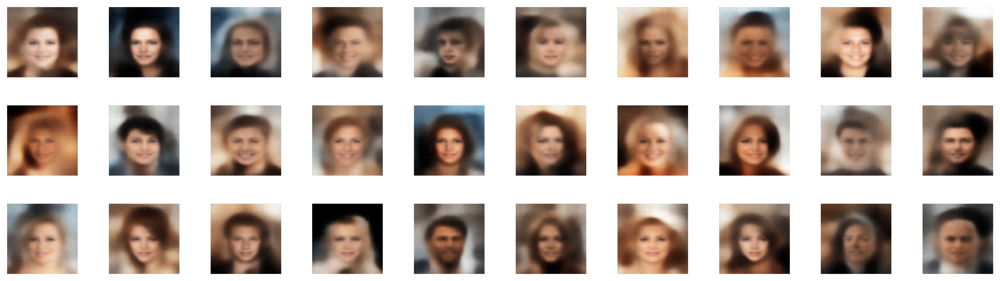

In [24]:
# newly generated faces

n_to_show = 30

znew = np.random.normal(size = (n_to_show, VAE.z_dim))

reconst = VAE.decoder.predict(np.array(znew))

fig = plt.figure(figsize=(18, 5))
fig.subplots_adjust(hspace=0.4, wspace=0.4)
for i in range(n_to_show):
    ax = fig.add_subplot(3, 10, i+1)
    ax.imshow(reconst[i, :,:,:])
    ax.axis('off')

plt.show()